# Загрузка данных

In [1]:
# Скачиваем Stanford Dogs Dataset
!wget -O images.tar http://vision.stanford.edu/aditya86/ImageNetDogs/images.tar
!wget -O annotation.tar http://vision.stanford.edu/aditya86/ImageNetDogs/annotation.tar

# Распаковываем
!tar -xf images.tar
!tar -xf annotation.tar

print("Датасет загружен!")

--2025-12-27 05:35:47--  http://vision.stanford.edu/aditya86/ImageNetDogs/images.tar
Resolving vision.stanford.edu (vision.stanford.edu)... 171.64.68.10
Connecting to vision.stanford.edu (vision.stanford.edu)|171.64.68.10|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 793579520 (757M) [application/x-tar]
Saving to: ‘images.tar’

images.tar          100%[===================>] 756.82M  23.0MB/s    in 26s     

2025-12-27 05:36:13 (29.6 MB/s) - ‘images.tar’ saved [793579520/793579520]

--2025-12-27 05:36:13--  http://vision.stanford.edu/aditya86/ImageNetDogs/annotation.tar
Resolving vision.stanford.edu (vision.stanford.edu)... 171.64.68.10
Connecting to vision.stanford.edu (vision.stanford.edu)|171.64.68.10|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 21852160 (21M) [application/x-tar]
Saving to: ‘annotation.tar’

annotation.tar      100%[===================>]  20.84M  8.26MB/s    in 2.5s    

2025-12-27 05:36:16 (8.26 MB/s) - ‘annotat

# Примеры изображений

In [2]:
# В каждой папке хранится отдельная порода
!ls Images | head -5

n02085620-Chihuahua
n02085782-Japanese_spaniel
n02085936-Maltese_dog
n02086079-Pekinese
n02086240-Shih-Tzu


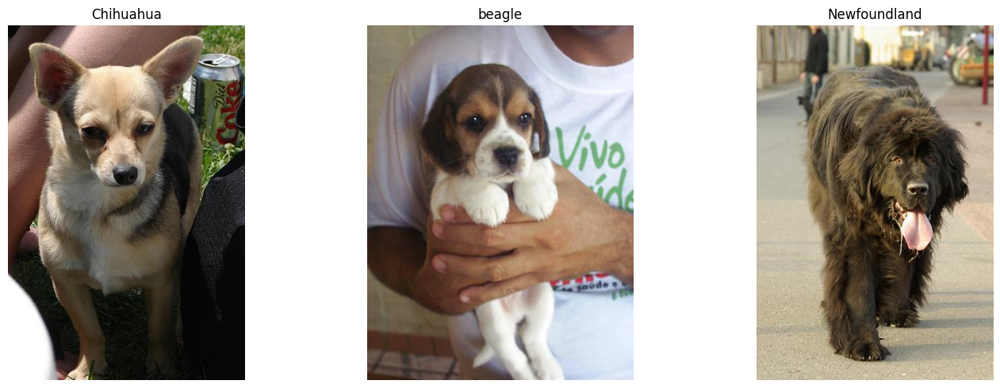

In [3]:
from PIL import Image
import matplotlib.pyplot as plt

# Список путей к изображениям
image_paths = [
    "/content/Images/n02085620-Chihuahua/n02085620_10074.jpg",
    "/content/Images/n02088364-beagle/n02088364_10108.jpg",
    "/content/Images/n02111277-Newfoundland/n02111277_10160.jpg"
]

# Настраиваем фигуру: 1 ряд, 3 колонки
fig, axes = plt.subplots(1, len(image_paths), figsize=(15, 5))

# Отключаем оси и показываем каждое изображение
for ax, img_path in zip(axes, image_paths):
    img = Image.open(img_path)
    ax.imshow(img)
    ax.axis('off')
    # Подпись с названием породы
    breed = img_path.split("/")[-2].split("-", 1)[1]
    ax.set_title(breed, fontsize=12)

plt.tight_layout()
plt.show()

# Детекция

In [4]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 24.1 MB/s eta 0:00:00


In [5]:
import os
import random
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO
from pathlib import Path

# === 1. Загружаем модель ===
print("Загружаем YOLOv8...")
model = YOLO("yolov8s.pt")
# model(str(img_path), conf=0.1)

# === 2. Собираем список всех фото ===
image_dir = Path("Images")
all_images = list(image_dir.rglob("*.jpg"))
print(f"Найдено {len(all_images)} изображений")

# Выбираем случайные 50
random.seed(42)
test_images = random.sample(all_images, min(50, len(all_images)))
print(f"Тестируем на {len(test_images)} изображениях")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Загружаем YOLOv8...
Найдено 20580 изображений
Тестируем на 50 изображениях


In [6]:
# results = []
# dog_class_id = None

# # Определяем ID класса "dog" по имени
# for cls_id, name in model.names.items():
#     if name == "dog":
#         dog_class_id = cls_id
#         break

# if dog_class_id is None:
#     raise ValueError("Класс 'dog' не найден в модели!")

# print(f"Класс 'dog' = {dog_class_id}")

# found_count = 0
# total_count = len(test_images)

# for img_path in test_images:
#     # Детекция
#     yolo_results = model(str(img_path), verbose=False)
#     boxes = yolo_results[0].boxes

#     # Фильтруем ТОЛЬКО собак
#     dog_boxes = []
#     for box in boxes:
#         if int(box.cls.item()) == dog_class_id:
#             dog_boxes.append(box)

#     # Выбираем bbox с максимальной уверенностью
#     best_dog_box = None
#     if dog_boxes:
#         best_dog_box = max(dog_boxes, key=lambda b: b.conf.item())
#         found_count += 1

#     results.append({
#         "path": img_path,
#         "found": best_dog_box is not None,
#         "best_box": best_dog_box  # сохраняем для визуализации
#     })

# # === 4. Выводим статистику ===
# print("\n" + "="*50)
# print(f"✅ Найдено собак: {found_count} из {total_count}")
# print(f"🎯 Точность детекции: {found_count / total_count:.1%}")
# print("="*50)

Класс 'dog' = 16

✅ Найдено собак: 48 из 50
🎯 Точность детекции: 96.0%


In [25]:
results = []
dog_class_id = None

# Определяем ID класса "dog" по имени
for cls_id, name in model.names.items():
    if name == "dog":
        dog_class_id = cls_id
        break

if dog_class_id is None:
    raise ValueError("Класс 'dog' не найден в модели!")

print(f"Класс 'dog' = {dog_class_id}")

found_count = 0
total_count = len(test_images)

for img_path in test_images:
    # Детекция
    yolo_results = model(str(img_path), verbose=False)
    boxes = yolo_results[0].boxes

    # Фильтруем ТОЛЬКО собак
    dog_boxes = []
    for box in boxes:
        if int(box.cls.item()) == dog_class_id:
            dog_boxes.append(box)

    # Выбираем bbox с максимальной уверенностью
    best_bbox_coords = None  # ← теперь храним координаты
    if dog_boxes:
        best_box = max(dog_boxes, key=lambda b: b.conf.item())
        # 👇 ИЗВЛЕКАЕМ КООРДИНАТЫ как кортеж (x1, y1, x2, y2)
        best_bbox_coords = tuple(map(int, best_box.xyxy[0].tolist()))
        found_count += 1

    results.append({
        "path": img_path,
        "found": best_bbox_coords is not None,
        "best_box": best_bbox_coords  # ← сохраняем именно координаты
    })

print("\n" + "="*50)
print(f"✅ Найдено собак: {found_count} из {total_count}")
print(f"🎯 Точность детекции: {found_count / total_count:.1%}")
print("="*50)

Класс 'dog' = 16

✅ Найдено собак: 48 из 50
🎯 Точность детекции: 96.0%


In [7]:
# def show_image_with_bbox(img_path, best_box=None):
#     img = cv2.imread(str(img_path))

#     if best_box is not None:
#         # Рисуем ТОЛЬКО самый уверенный bbox
#         x1, y1, x2, y2 = map(int, best_box.xyxy[0].tolist())
#         cv2.rectangle(img, (x1, y1), (x2, y2), (0, 0, 255), 3)
#         conf = best_box.conf.item()
#         cv2.putText(
#             img, f"Dog {conf:.2f}",
#             (x1, y1 - 10),
#             cv2.FONT_HERSHEY_SIMPLEX,
#             0.9, (0, 0, 255), 2
#         )
#         title = "✅ Собака найдена (самая уверенная)"
#     else:
#         title = "❌ Собака НЕ найдена"

#     img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#     plt.figure(figsize=(8, 6))
#     plt.imshow(img_rgb)
#     plt.title(f"{title}\n{img_path.parent.name}/{img_path.name}")
#     plt.axis('off')
#     plt.show()

In [17]:
found_examples = [r for r in results if r["found"]][:]
not_found_examples = [r for r in results if not r["found"]][:]

In [20]:
import cv2
import matplotlib.pyplot as plt

def show_image_with_bbox(img_path, bbox=None):
    """
    Показывает изображение с bounding box, если bbox задан.
    bbox должен быть кортежем (x1, y1, x2, y2)
    """
    # Загружаем изображение
    img = cv2.imread(str(img_path))
    if img is None:
        print(f"❌ Не удалось загрузить: {img_path}")
        return

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    title = "❌ Собака НЕ найдена"

    if bbox is not None:
        x1, y1, x2, y2 = map(int, bbox)  # убедиться, что int

        # Рисуем рамку вручную
        img_with_box = cv2.rectangle(
            img.copy(),
            (x1, y1),
            (x2, y2),
            color=(255, 0, 0),  # синий в BGR (отображается как красный в RGB)
            thickness=3
        )
        img_rgb = cv2.cvtColor(img_with_box, cv2.COLOR_BGR2RGB)
        title = "✅ Собака найдена"

    plt.figure(figsize=(8, 6))
    plt.imshow(img_rgb)
    plt.title(f"{title}\n{img_path.parent.name}/{img_path.name}")
    plt.axis('off')
    plt.show()


🔍 Примеры успешной детекции:


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


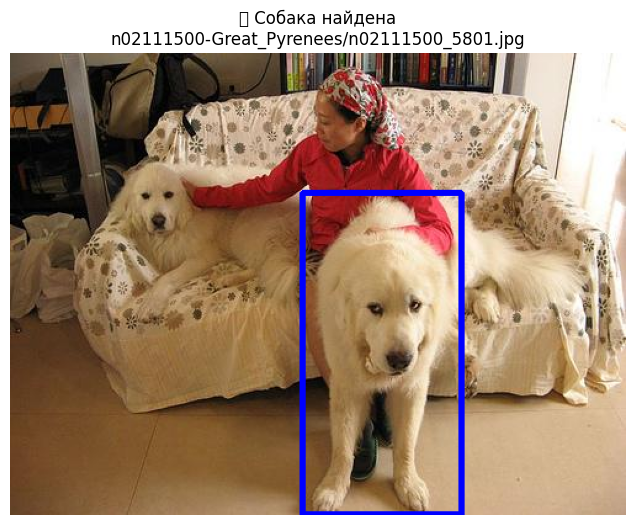

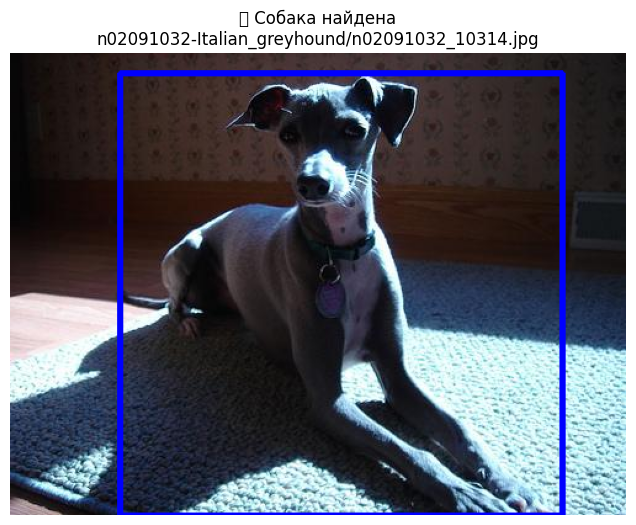

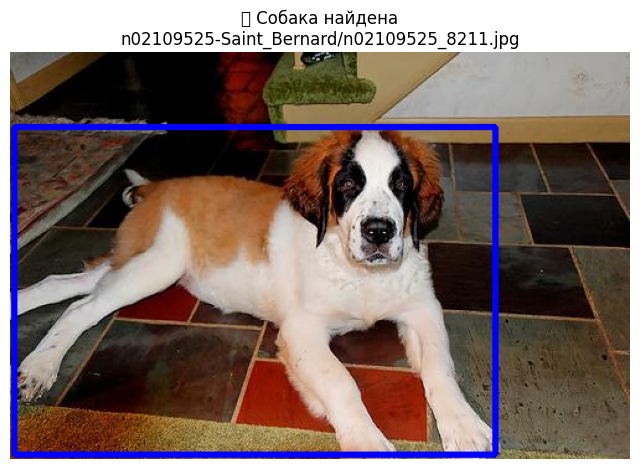

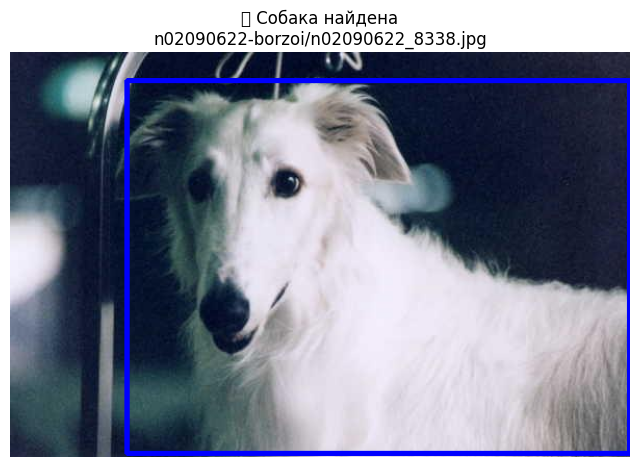

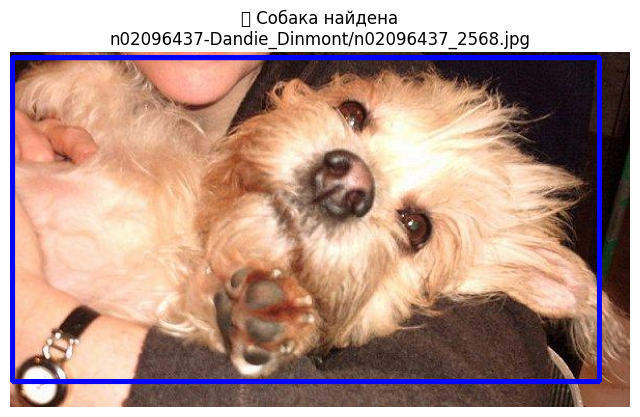

In [29]:
print("\n🔍 Примеры успешной детекции:")

for ex in found_examples[:5]:
    img_path = ex["path"]
    bbox = ex["best_box"]

    show_image_with_bbox(img_path, bbox)


⚠️ Примеры, где собака НЕ найдена:


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


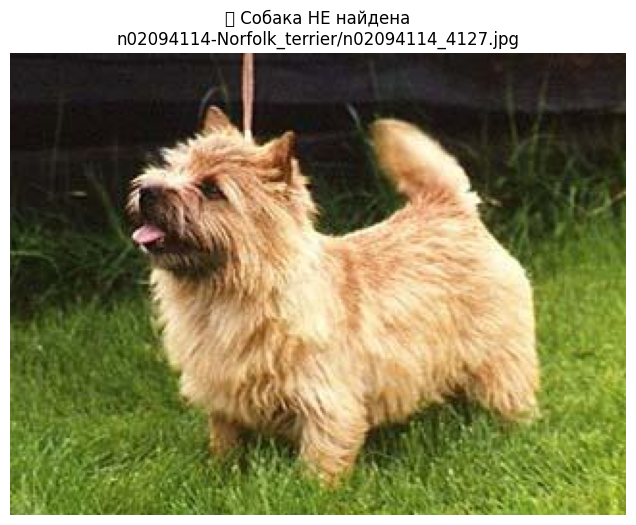

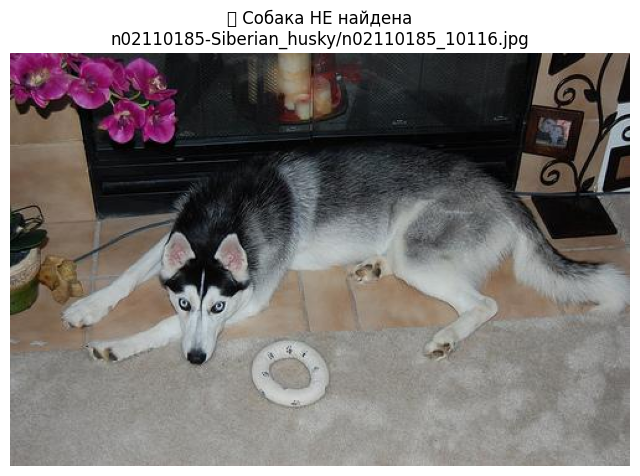

In [27]:
print("\n⚠️ Примеры, где собака НЕ найдена:")

for ex in not_found_examples:
    img_path = ex["path"]
    bbox = ex["best_box"]

    show_image_with_bbox(img_path, bbox)

# Обрезка изображений

In [14]:
from PIL import Image
import matplotlib.pyplot as plt

def crop_and_show(img_path, bbox):
    """
    Обрезает изображение по bbox и показывает результат.
    """
    # Загружаем изображение
    img = Image.open(img_path).convert("RGB")

    # Обрезаем по bbox (x1, y1, x2, y2)
    cropped = img.crop(bbox)

    # Визуализация: оригинал + обрезанное
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # Оригинал
    axes[0].imshow(img)
    axes[0].set_title("Оригинал")
    axes[0].axis('off')

    # Обрезанное
    axes[1].imshow(cropped)
    axes[1].set_title("Обрезанная область (только собака)")
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()

    return cropped


🔍 Примеры успешной детекции и обрезки:


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


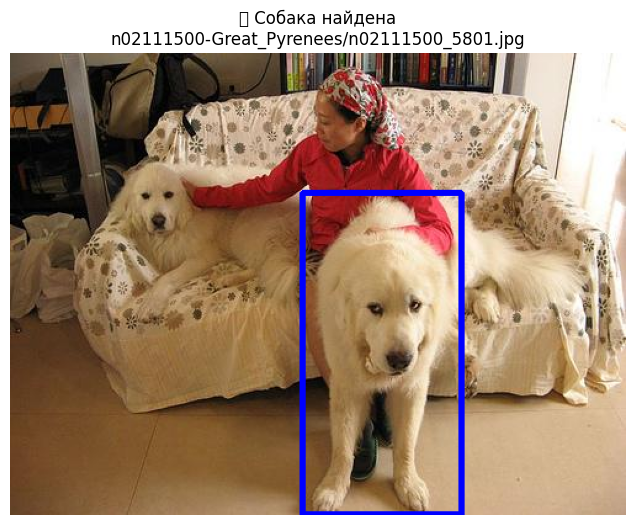

📷 Обрезка для: n02111500_5801.jpg


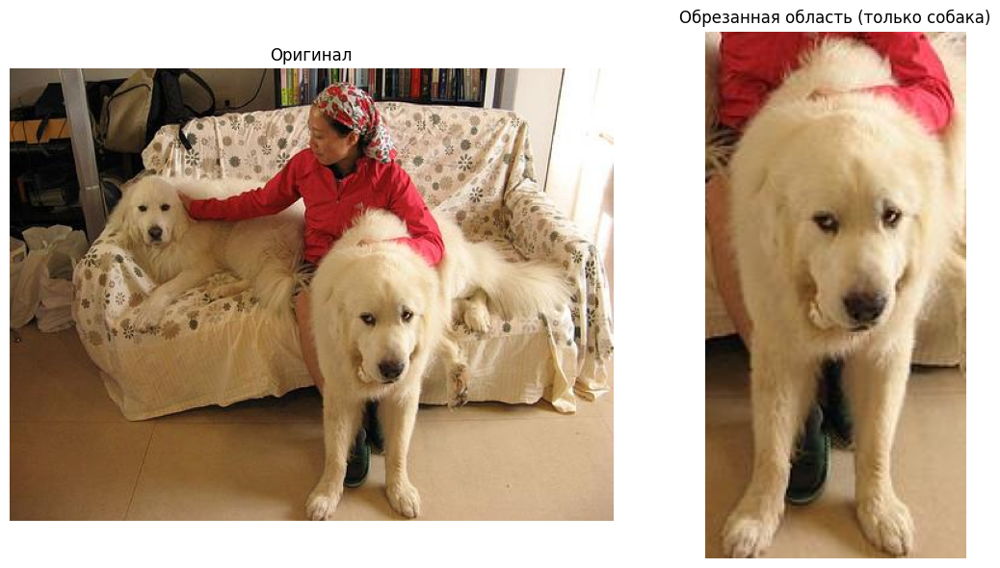

--------------------------------------------------


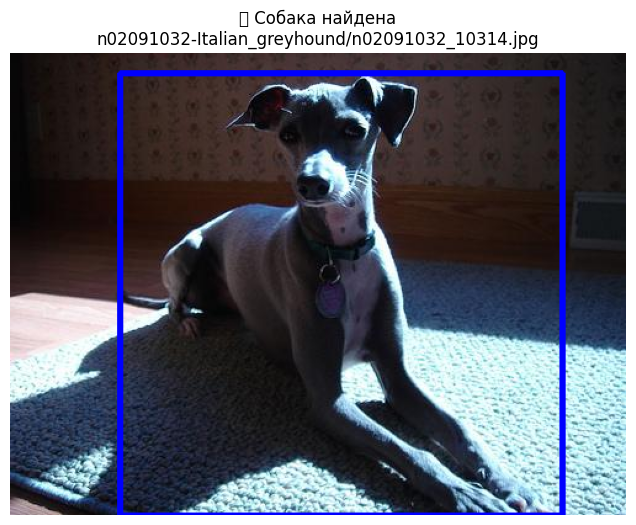

📷 Обрезка для: n02091032_10314.jpg


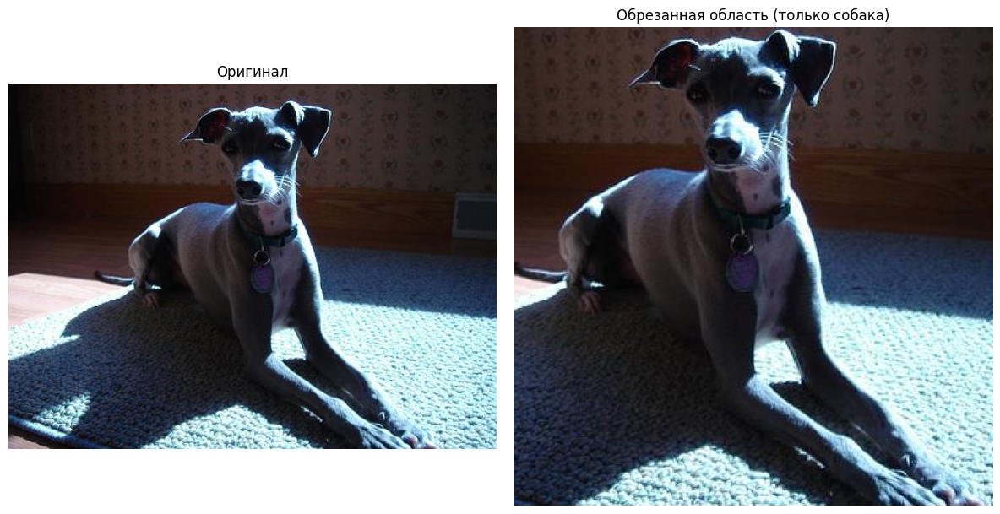

--------------------------------------------------


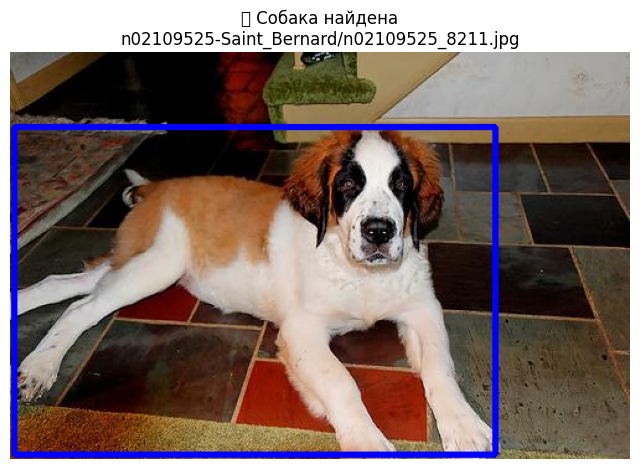

📷 Обрезка для: n02109525_8211.jpg


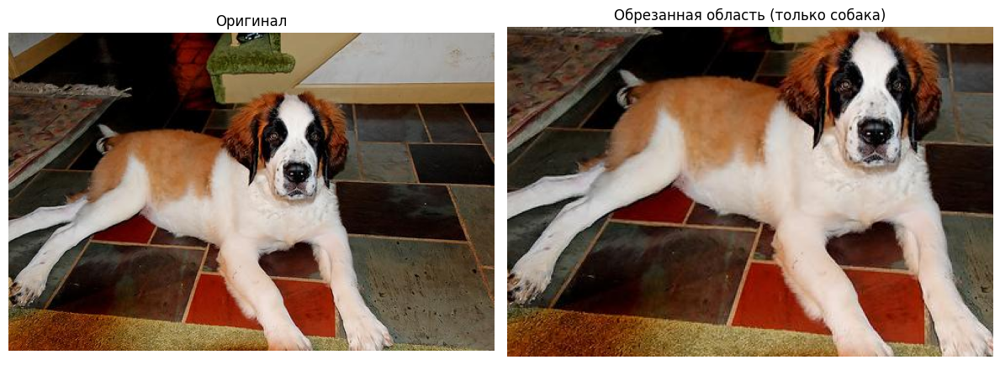

--------------------------------------------------


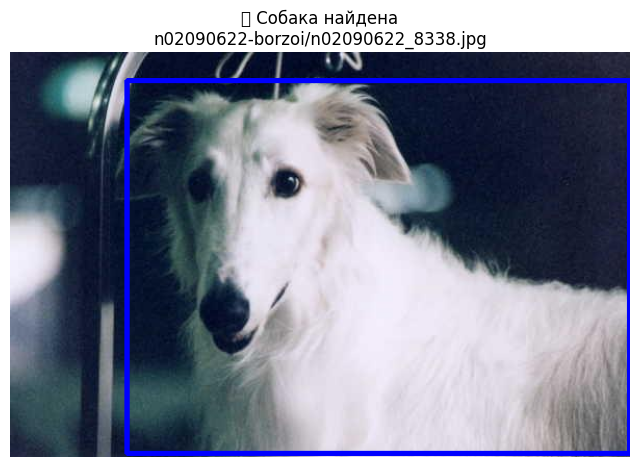

📷 Обрезка для: n02090622_8338.jpg


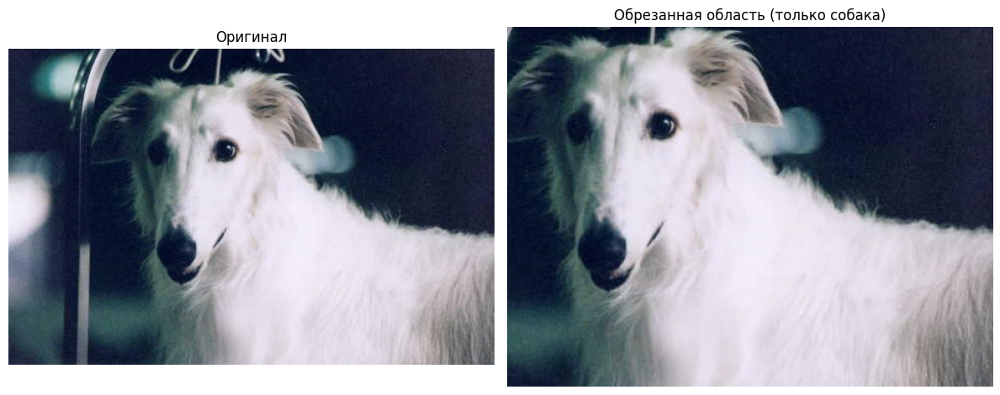

--------------------------------------------------


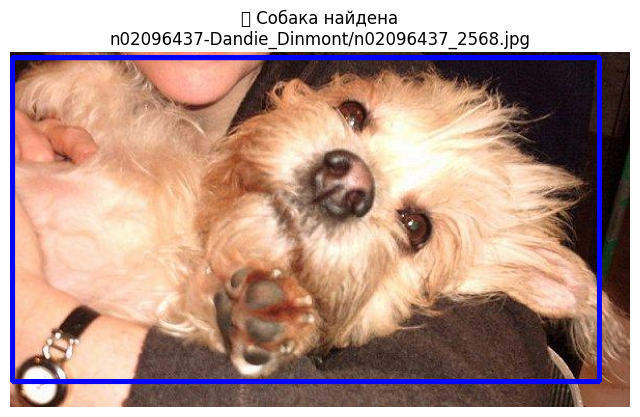

📷 Обрезка для: n02096437_2568.jpg


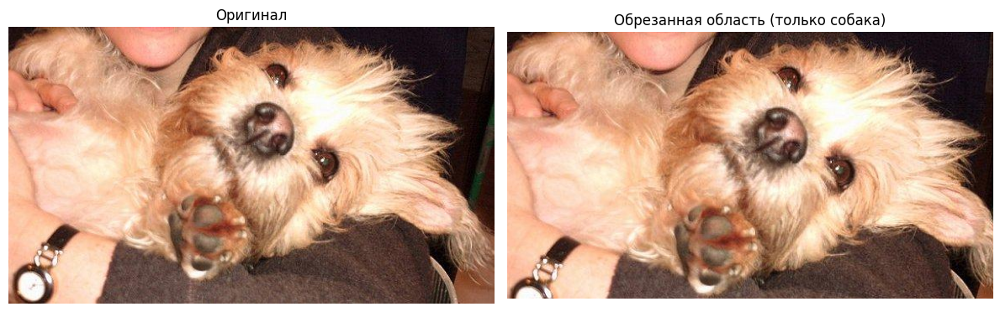

--------------------------------------------------


In [28]:
print("\n🔍 Примеры успешной детекции и обрезки:")

for ex in found_examples[:5]:
    img_path = ex["path"]
    bbox = ex["best_box"]

    # Сначала покажем оригинал с bbox (как раньше)
    show_image_with_bbox(img_path, bbox)

    # Теперь обрежем и покажем результат
    print(f"📷 Обрезка для: {img_path.name}")
    cropped_img = crop_and_show(str(img_path), bbox)

    print("-" * 50)